## SBPL Testing
SBPL planners need some parameter tuning to be competitive.

In [1]:
%load_ext autoreload
%autoreload 2
import matplotlib as mpl
mpl.rcParams['mathtext.fontset'] = 'cm'
# make sure to not use Level-3 fonts
mpl.rcParams['pdf.fonttype'] = 42

from plot_env import plot_env
import json
from plot_env import plot_env, plot_env_options
from plot_trajectory import plot_trajectory, plot_nodes, plot_trajectory_options
from color import get_color, get_colors
from definitions import *
import matplotlib.pyplot as plt
from mpb import MPB, MultipleMPB

### SBPL motion primitive resolution
Default is 0.25.

Available memory: 17.67 GB, limiting each MPB process to 41.7% usage (7.36 GB).
Creating pool of 20 processes.
All benchmarks succeeded.
Successfully merged [sbpl_debugging/sbpl resolution 0.0625 sbpl_adstar_results.json, sbpl_debugging/sbpl resolution 0.0625 sbpl_anastar_results.json, sbpl_debugging/sbpl resolution 0.0625 sbpl_arastar_results.json, sbpl_debugging/sbpl resolution 0.0625 sbpl_lazy_ara_results.json, sbpl_debugging/sbpl resolution 0.0625 sbpl_mha_results.json] into sbpl_debugging/sbpl resolution 0.0625.json.
Visualizing sbpl_debugging/sbpl resolution 0.0625.json
Planner SBPL_ADstar found no solution!
Planner SBPL_ANAstar found no solution!
Planner SBPL_ARAstar found no solution!
Planner SBPL_Lazy_ARA found no solution!
Planner SBPL_MHA found no solution!


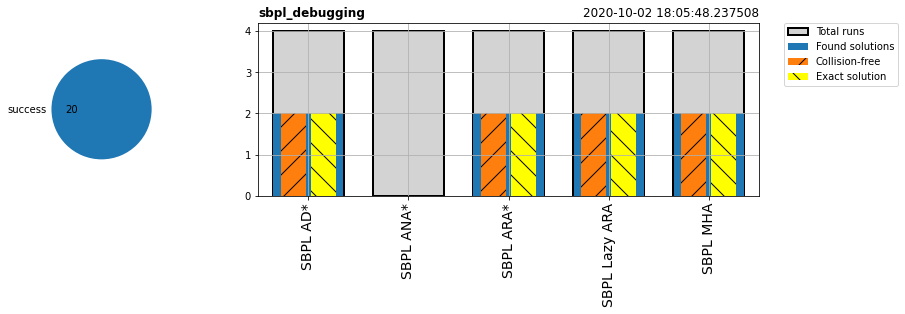

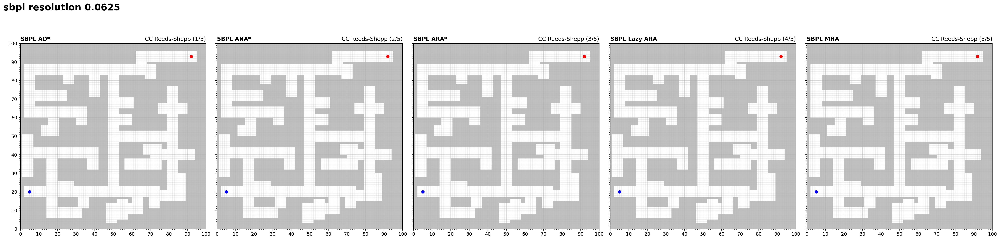

Successfully merged [sbpl_debugging/sbpl resolution 0.125 sbpl_adstar_results.json, sbpl_debugging/sbpl resolution 0.125 sbpl_anastar_results.json, sbpl_debugging/sbpl resolution 0.125 sbpl_arastar_results.json, sbpl_debugging/sbpl resolution 0.125 sbpl_lazy_ara_results.json, sbpl_debugging/sbpl resolution 0.125 sbpl_mha_results.json] into sbpl_debugging/sbpl resolution 0.125.json.
Visualizing sbpl_debugging/sbpl resolution 0.125.json
Planner SBPL_ANAstar found no solution!


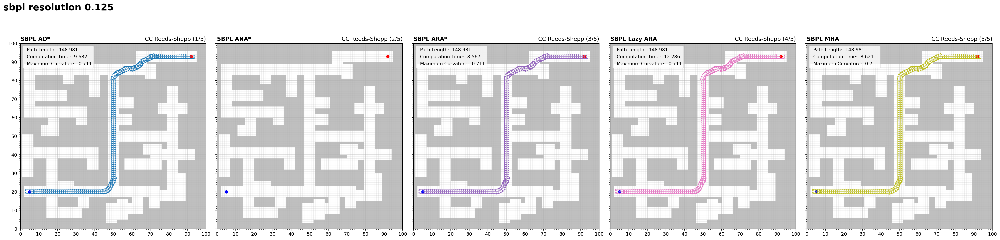

Successfully merged [sbpl_debugging/sbpl resolution 0.25 sbpl_adstar_results.json, sbpl_debugging/sbpl resolution 0.25 sbpl_anastar_results.json, sbpl_debugging/sbpl resolution 0.25 sbpl_arastar_results.json, sbpl_debugging/sbpl resolution 0.25 sbpl_lazy_ara_results.json, sbpl_debugging/sbpl resolution 0.25 sbpl_mha_results.json] into sbpl_debugging/sbpl resolution 0.25.json.
Visualizing sbpl_debugging/sbpl resolution 0.25.json
Planner SBPL_ANAstar found no solution!


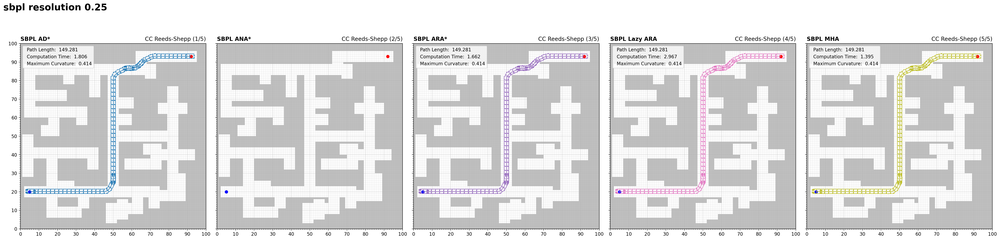

Successfully merged [sbpl_debugging/sbpl resolution 1 sbpl_adstar_results.json, sbpl_debugging/sbpl resolution 1 sbpl_anastar_results.json, sbpl_debugging/sbpl resolution 1 sbpl_arastar_results.json, sbpl_debugging/sbpl resolution 1 sbpl_lazy_ara_results.json, sbpl_debugging/sbpl resolution 1 sbpl_mha_results.json] into sbpl_debugging/sbpl resolution 1.json.
Visualizing sbpl_debugging/sbpl resolution 1.json
Planner SBPL_ADstar found no solution!
Planner SBPL_ANAstar found no solution!
Planner SBPL_ARAstar found no solution!
Planner SBPL_Lazy_ARA found no solution!
Planner SBPL_MHA found no solution!


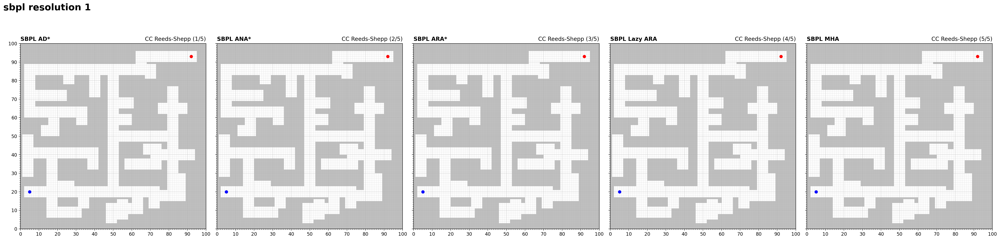

In [3]:
parameters = ["0.0625", "0.125", "0.25", "1"]
pool = MultipleMPB()
for i, parameter in enumerate(parameters):
    for planner in sbpl_planners:
        m = MPB()
        m.set_corridor_grid_env(100, 100, branches=100, radius=3)
        m.set_planners([planner])
        m["max_planning_time"] = 30
        m["env.collision.collision_model"] = 1
        m["sbpl.scaling"] = 1
        m["sbpl.motion_primitive_filename"] = "./sbpl_mprim/unicycle_%s.mprim" % parameter
        m["sbpl.resolution"] = float(parameter)
        m.set_id("sbpl resolution %s %s" % (parameter, planner))
        pool.benchmarks.append(m)
run_result = pool.run_parallel("sbpl_debugging", processes=20, limit_memory=True, silence=True)

for i, parameter in enumerate(parameters): 
    j, k = i * len(sbpl_planners), (i + 1) * len(sbpl_planners)
    m = MPB.merge(pool.benchmarks[j:k], "sbpl_debugging/sbpl resolution %s.json" % parameter, make_separate_runs=True)
    m.visualize_trajectory_grid()

### SBPL environment scaling factor
It used to be 8, now 6 is the best?

Running MPB with ID sbpl scaling 1 (log file at sbpl scaling 1.log)...



Visualizing sbpl scaling 1_results.json


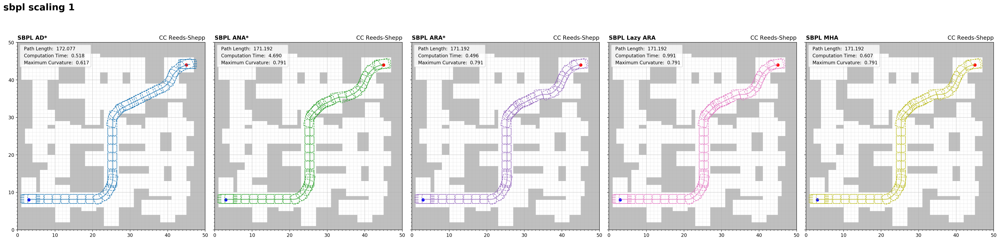

Running MPB with ID sbpl scaling 6 (log file at sbpl scaling 6.log)...



Visualizing sbpl scaling 6_results.json
Planner SBPL_ADstar found no solution!
Planner SBPL_ANAstar found no solution!
Planner SBPL_ARAstar found no solution!
Planner SBPL_Lazy_ARA found no solution!
Planner SBPL_MHA found no solution!


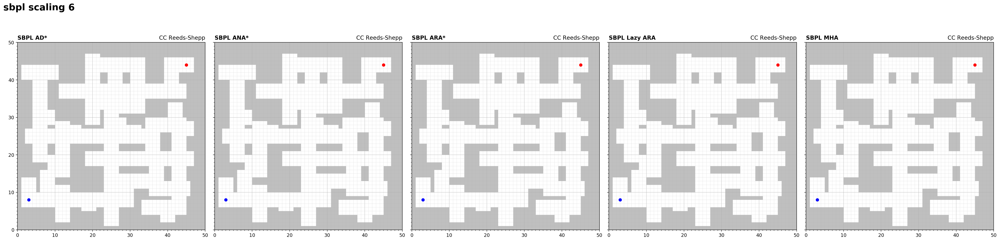

Running MPB with ID sbpl scaling 7 (log file at sbpl scaling 7.log)...



Visualizing sbpl scaling 7_results.json
Planner SBPL_ADstar found no solution!
Planner SBPL_ANAstar found no solution!
Planner SBPL_ARAstar found no solution!
Planner SBPL_Lazy_ARA found no solution!
Planner SBPL_MHA found no solution!


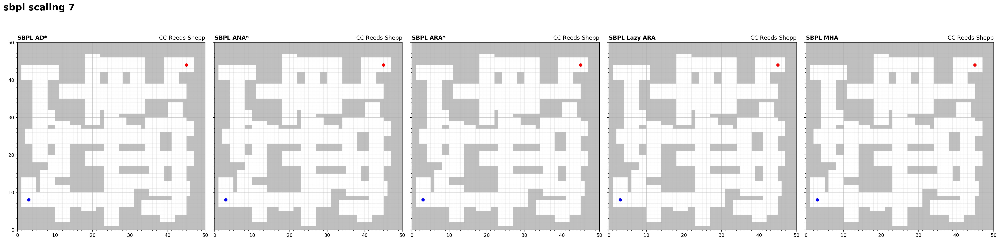

Running MPB with ID sbpl scaling 8 (log file at sbpl scaling 8.log)...



Visualizing sbpl scaling 8_results.json
Planner SBPL_ADstar found no solution!
Planner SBPL_ANAstar found no solution!
Planner SBPL_ARAstar found no solution!
Planner SBPL_Lazy_ARA found no solution!
Planner SBPL_MHA found no solution!


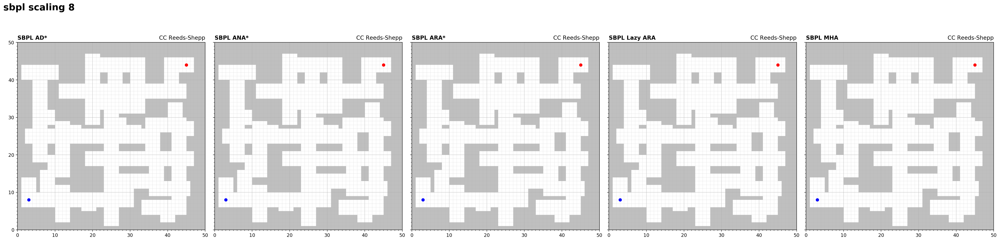

Running MPB with ID sbpl scaling 9 (log file at sbpl scaling 9.log)...



Visualizing sbpl scaling 9_results.json
Planner SBPL_ADstar found no solution!
Planner SBPL_ANAstar found no solution!
Planner SBPL_ARAstar found no solution!
Planner SBPL_Lazy_ARA found no solution!
Planner SBPL_MHA found no solution!


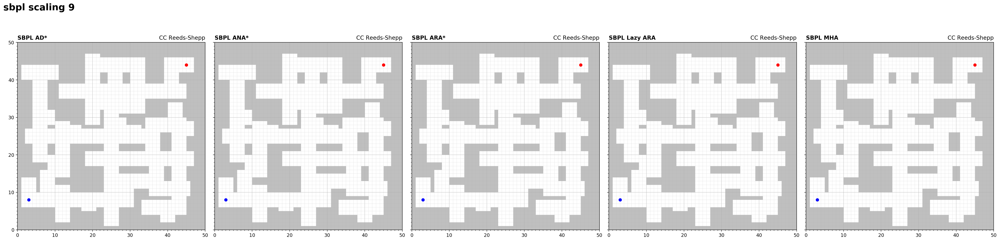

Running MPB with ID sbpl scaling 10 (log file at sbpl scaling 10.log)...



Visualizing sbpl scaling 10_results.json
Planner SBPL_ADstar found no solution!
Planner SBPL_ANAstar found no solution!
Planner SBPL_ARAstar found no solution!
Planner SBPL_Lazy_ARA found no solution!
Planner SBPL_MHA found no solution!


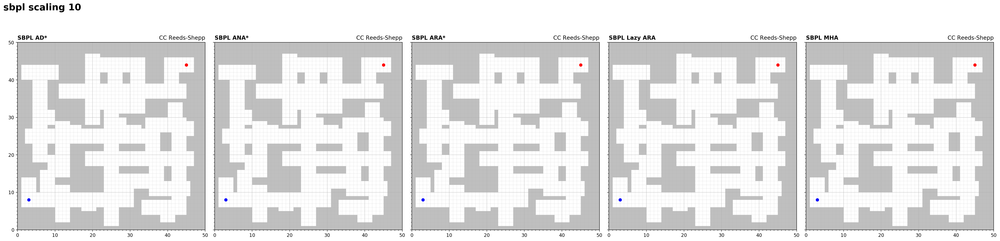

Running MPB with ID sbpl scaling 11 (log file at sbpl scaling 11.log)...



Visualizing sbpl scaling 11_results.json
Planner SBPL_ADstar found no solution!
Planner SBPL_ANAstar found no solution!
Planner SBPL_ARAstar found no solution!
Planner SBPL_Lazy_ARA found no solution!
Planner SBPL_MHA found no solution!


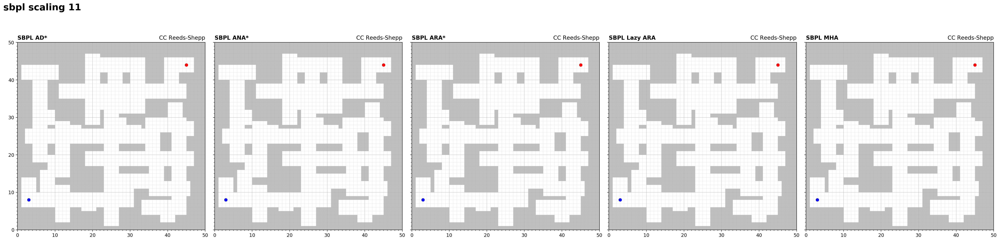

Running MPB with ID sbpl scaling 12 (log file at sbpl scaling 12.log)...



Visualizing sbpl scaling 12_results.json
Planner SBPL_ADstar found no solution!
Planner SBPL_ANAstar found no solution!
Planner SBPL_ARAstar found no solution!
Planner SBPL_Lazy_ARA found no solution!
Planner SBPL_MHA found no solution!


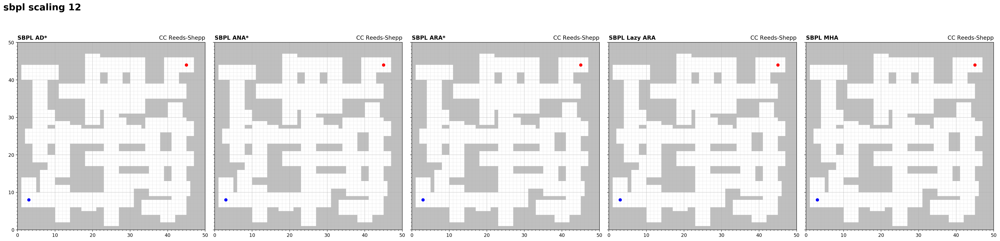

In [3]:
parameters = [1, 6, 7, 8, 9, 10, 11, 12]
for i, parameter in enumerate(parameters):
    m = MPB()
    m.set_corridor_grid_env(50, 50, branches=100, radius=2)
    m.set_planners(sbpl_planners)
    m["max_planning_time"] = 10
    m["sbpl.scaling"] = parameter
    m["sbpl.motion_primitive_filename"] = "./sbpl_mprim/unicycle_0.25.mprim" 
    m["sbpl.resolution"] = float(0.25)
    m.run(id="sbpl scaling %g" % parameter, show_progress_bar=True, runs=1)
    m.visualize_trajectory_grid()

### Initial solution epsilon
How much deviation from optimal solution is acceptable (>1)? Ignored by planners that don't have notion of epsilon, 1 means optimal search.
Default setting was 3.

Running MPB with ID sbpl initial_solution_eps 1 (log file at sbpl initial_solution_eps 1.log)...



Visualizing sbpl initial_solution_eps 1_results.json


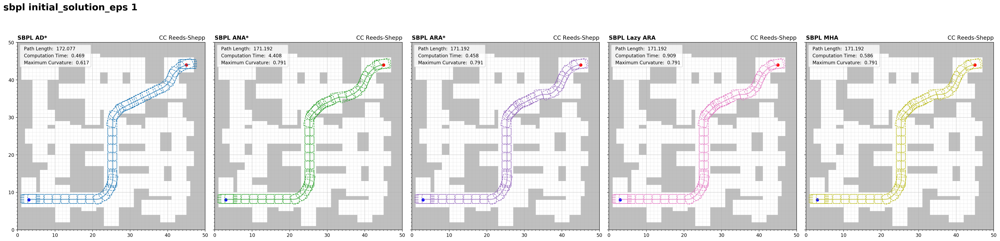

Running MPB with ID sbpl initial_solution_eps 2 (log file at sbpl initial_solution_eps 2.log)...



Visualizing sbpl initial_solution_eps 2_results.json


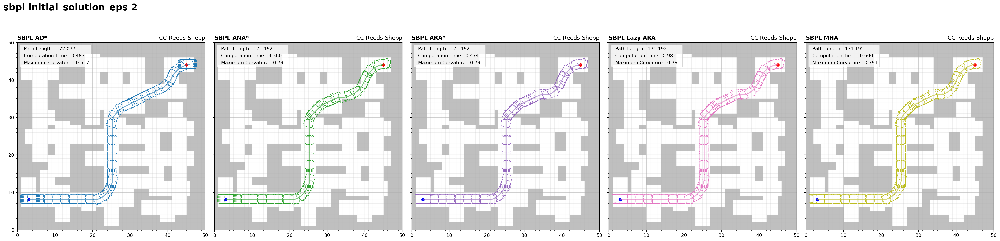

Running MPB with ID sbpl initial_solution_eps 3 (log file at sbpl initial_solution_eps 3.log)...



Visualizing sbpl initial_solution_eps 3_results.json


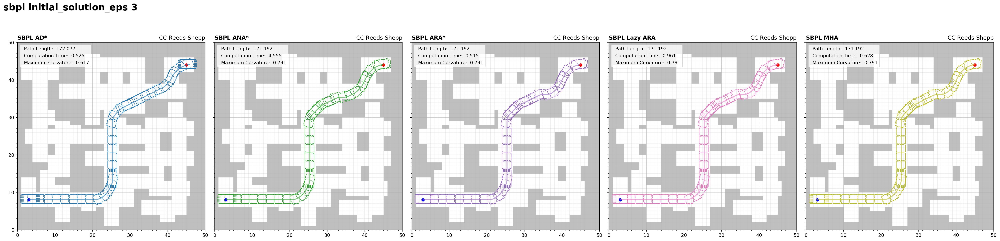

Running MPB with ID sbpl initial_solution_eps 5 (log file at sbpl initial_solution_eps 5.log)...



Visualizing sbpl initial_solution_eps 5_results.json


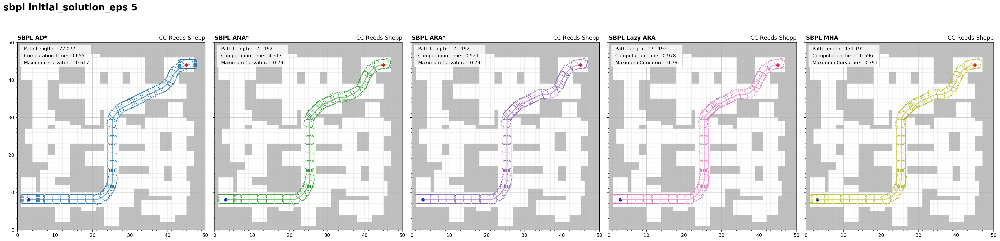

In [4]:
parameters = [1, 2, 3, 5]
for i, parameter in enumerate(parameters):
    m = MPB()
    m.set_corridor_grid_env(50, 50, branches=100, radius=2)
    m.set_planners(sbpl_planners)
    m["max_planning_time"] = 10
    m["sbpl.initial_solution_eps"] = parameter
    m["sbpl.scaling"] = 1
    m.run(id="sbpl initial_solution_eps %g" % parameter, show_progress_bar=True, runs=1)
    m.visualize_trajectory_grid()

### Forward velocity
Default setting was 0.2.

Running MPB with ID sbpl forward_velocity 0.1 (log file at sbpl forward_velocity 0.1.log)...



Visualizing sbpl forward_velocity 0.1_results.json


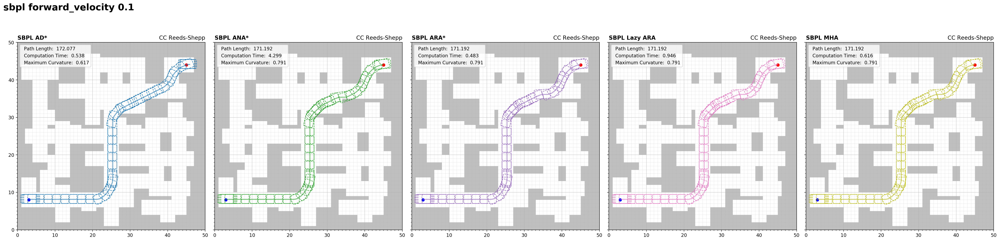

Running MPB with ID sbpl forward_velocity 0.2 (log file at sbpl forward_velocity 0.2.log)...



Visualizing sbpl forward_velocity 0.2_results.json


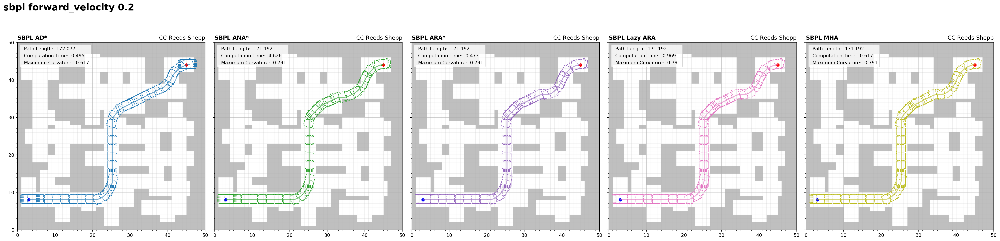

Running MPB with ID sbpl forward_velocity 0.3 (log file at sbpl forward_velocity 0.3.log)...



Visualizing sbpl forward_velocity 0.3_results.json


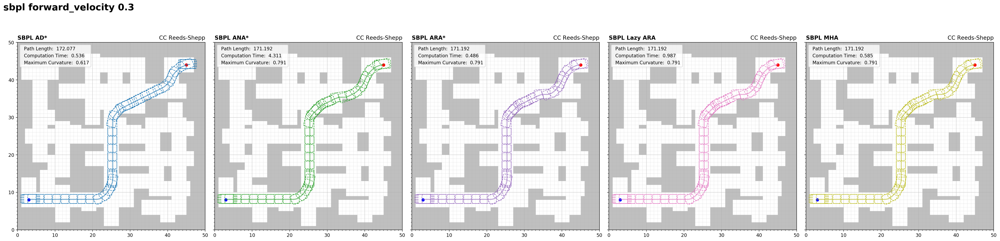

Running MPB with ID sbpl forward_velocity 0.6 (log file at sbpl forward_velocity 0.6.log)...



Visualizing sbpl forward_velocity 0.6_results.json


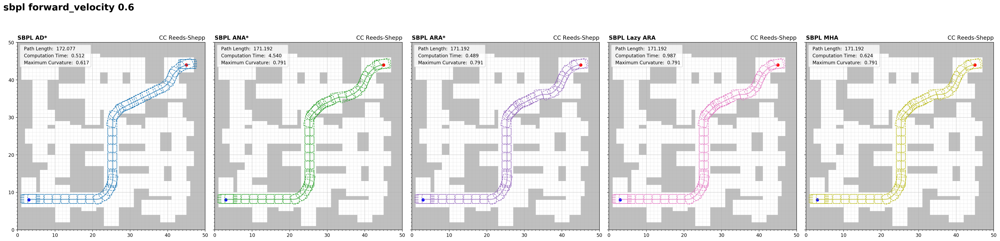

Running MPB with ID sbpl forward_velocity 1 (log file at sbpl forward_velocity 1.log)...



Visualizing sbpl forward_velocity 1_results.json


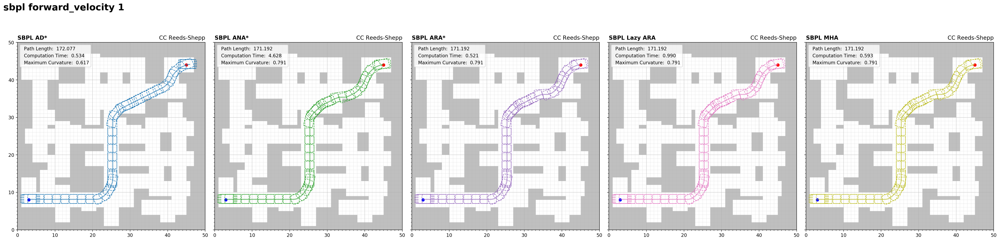

In [5]:
parameters = [0.1, 0.2, 0.3, 0.6, 1]
for i, parameter in enumerate(parameters):
    m = MPB()
    m.set_corridor_grid_env(50, 50, branches=100, radius=2)
    m.set_planners(sbpl_planners)
    m["max_planning_time"] = 10
    m["sbpl.forward_velocity"] = parameter
    m["sbpl.scaling"] = 1
    m.run(id="sbpl forward_velocity %g" % parameter, show_progress_bar=True, runs=1)
    m.visualize_trajectory_grid()

### Time to turn 45 degrees in place
Default setting was 0.6

Running MPB with ID sbpl time_to_turn_45_degs_in_place 0.1 (log file at sbpl time_to_turn_45_degs_in_place 0.1.log)...



Visualizing sbpl time_to_turn_45_degs_in_place 0.1_results.json


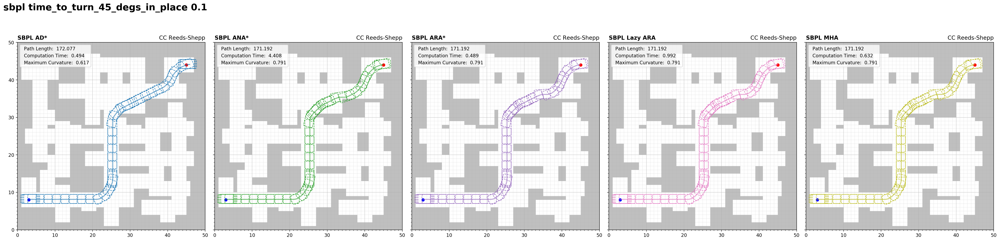

Running MPB with ID sbpl time_to_turn_45_degs_in_place 0.3 (log file at sbpl time_to_turn_45_degs_in_place 0.3.log)...



Visualizing sbpl time_to_turn_45_degs_in_place 0.3_results.json


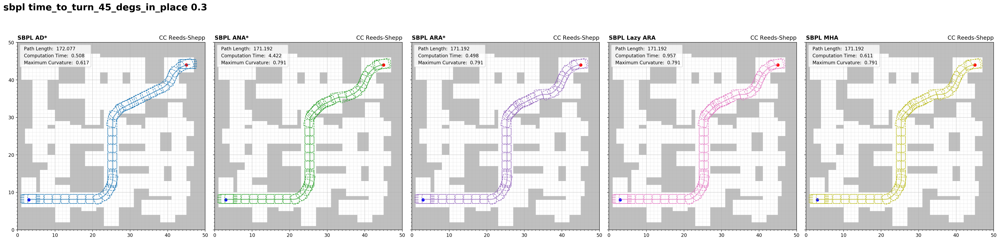

Running MPB with ID sbpl time_to_turn_45_degs_in_place 0.6 (log file at sbpl time_to_turn_45_degs_in_place 0.6.log)...



Visualizing sbpl time_to_turn_45_degs_in_place 0.6_results.json


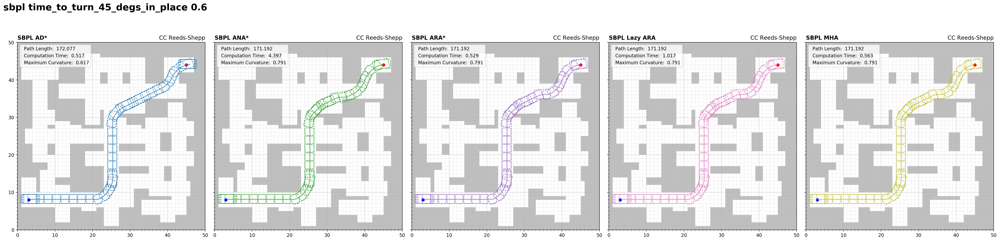

Running MPB with ID sbpl time_to_turn_45_degs_in_place 1 (log file at sbpl time_to_turn_45_degs_in_place 1.log)...



Visualizing sbpl time_to_turn_45_degs_in_place 1_results.json


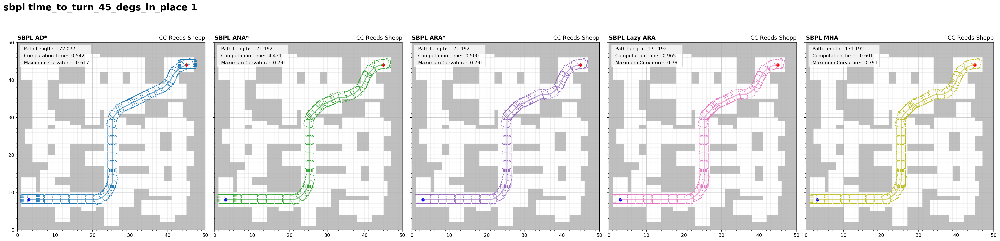

Running MPB with ID sbpl time_to_turn_45_degs_in_place 2 (log file at sbpl time_to_turn_45_degs_in_place 2.log)...



Visualizing sbpl time_to_turn_45_degs_in_place 2_results.json


KeyboardInterrupt: 

In [6]:
parameters = [0.1, 0.3, 0.6, 1, 2]
for i, parameter in enumerate(parameters):
    m = MPB()
    m.set_corridor_grid_env(50, 50, branches=100, radius=2)
    m.set_planners(sbpl_planners)
    m["max_planning_time"] = 10
    m["sbpl.time_to_turn_45_degs_in_place"] = parameter
    m["sbpl.scaling"] = 1
    m.run(id="sbpl time_to_turn_45_degs_in_place %g" % parameter, show_progress_bar=True, runs=1)
    m.visualize_trajectory_grid()